In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def make_fig(images, titles, plots, size):
    fig = plt.figure(figsize=size)
    for i in range(len(images)):
        fig.add_subplot(plots[0], plots[1], i+1)
        plt.imshow(images[i])
        plt.title(titles[i])
    plt.show()

def make_fig_gray(images, titles, plots, size):
    fig = plt.figure(figsize=size)
    for i in range(len(images)):
        fig.add_subplot(plots[0], plots[1], i+1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i])
    plt.show()

def display_image(image, cmap='gray'):
    plt.figure(figsize=(20, 20))
    plt.imshow(image, cmap=cmap)
    plt.show()

In [3]:
dog_image_path = 'C:\\Users\\Muhammad Tarek\\Downloads\\doggy.jpg'
dog_image = cv2.imread(dog_image_path)

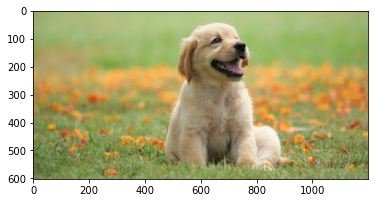

In [4]:
dog_image = cv2.cvtColor(dog_image, cv2.COLOR_BGR2RGB)
plt.imshow(dog_image)

# Drawing on a Picture
There are some ways of drawing on pictures in opencv, like:\
- cv2.rectangle
- cv2.circle
- cv2.line

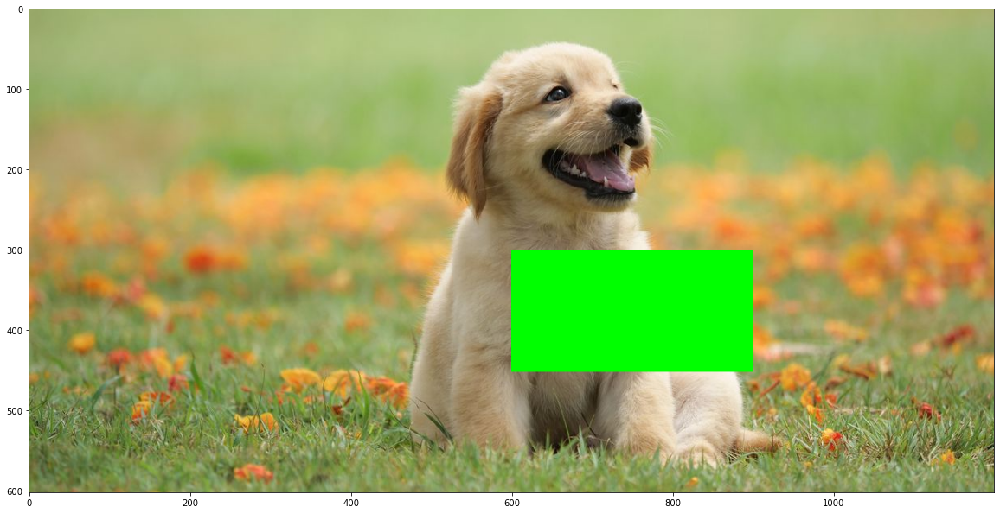

In [5]:

WIDTH = int(dog_image.shape[1])
HEIGHT = int(dog_image.shape[0])


# TOP LEFT CORNER OF RECTANGLE
x1 = WIDTH // 2
y1 = HEIGHT // 2

# WIDTH AND HEIGHT OF THE DRAWN RECTANGLE
w = WIDTH // 4
h = HEIGHT // 4

# BOTTOM RIGHT OF RECTANGLE
x2 = x1+w
y2 = y1+h

cv2.rectangle(dog_image, pt1=(x1, y1), pt2=(x2, y2), color=(0, 255, 0), thickness=-1)

display_image(dog_image)

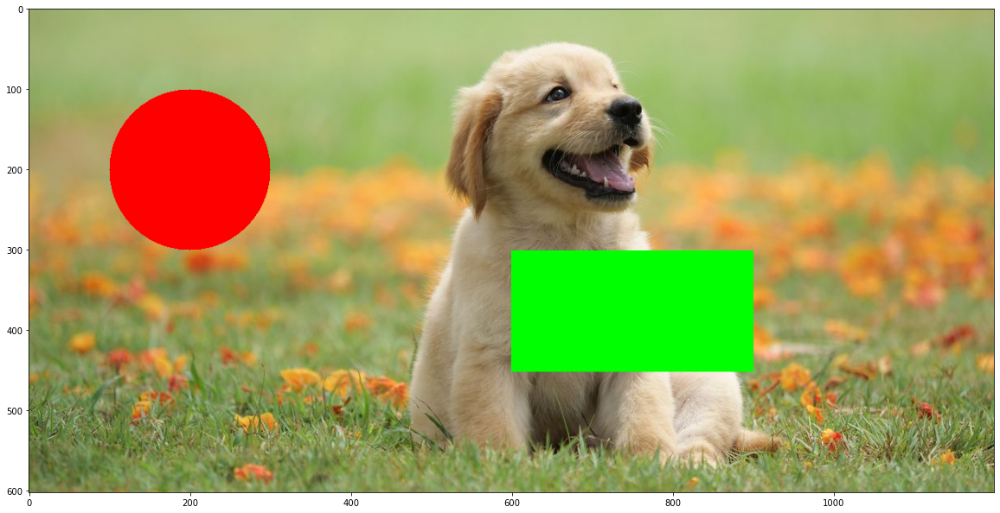

In [6]:
cv2.circle(dog_image, center=(200, 200), radius=100, color=(255, 0, 0), thickness=-1)
display_image(dog_image)

In [ ]:
# # CALLBACK FUNCTION TO DRAW RECTANGLE
# def draw_rectangle(event, x, y, flags, param):
#     global pt1, pt2, topLeft_clicked, bottomRight_clicked
    
#     if event == cv2.EVENT_LBUTTONDOWN:
        
#         # DRAW RECTANGLE
#         if not topLeft_clicked:
#             pt1 = (x, y)
#             topLeft_clicked = True
        
#         elif not bottomRight_clicked:
#             pt2 = (x, y)
#             bottomRight_clicked = True
        
#         # DRAW ANOTHER RECTANGLE
#         elif topLeft_clicked and bottomRight_clicked:
#             pt1 = (0, 0)
#             pt2 = (0, 0)
#             topLeft_clicked = False
#             bottomRight_clicked = False
        
# # GLOBAL VARIABLES
# pt1 = (0, 0)
# pt2 = (0, 0)
# topLeft_clicked = False
# bottomRight_clicked = False

# # CONNECT TO THE CALLBACK
# cap = cv2.VideoCapture(0)

# cv2.namedWindow('Camera')
# cv2.setMouseCallback('Camera', draw_rectangle)

# while True:
#     ret, frame = cap.read()
    
#     # DRAW ON THE FRAME
#     if topLeft_clicked:
#         cv2.circle(frame, center=pt1, radius=5, color=(0, 0, 255), thickness=-1)
    
#     if topLeft_clicked and bottomRight_clicked:
#         cv2.rectangle(frame, pt1=pt1, pt2=pt2, color=(0, 255, 0), thickness=4)
        
#     cv2.imshow('Camera', frame)
    
#     k = cv2.waitKey(1)
#     if k == 27:
#         break
        
# cv2.destroyAllWindows()
# cap.release

In [8]:
# drawing = False # true if mouse is pressed
# mode = True # if True, draw rectangle. Press 'm' to toggle to curve
# ix,iy = -1,-1
# # mouse callback function

# def draw_circle(event, x, y, flags, param):
#     global ix, iy, drawing, mode
    
#     if event == cv2.EVENT_LBUTTONDOWN:
#         drawing = True
#         ix,iy = x,y
        
#     elif event == cv2.EVENT_MOUSEMOVE:
#         if drawing == True:
#             if mode == True:
#                 cv2.rectangle(img, (ix,iy), (x,y), (0,255,0), -1)
#             else:
#                 cv2.circle(img, (x,y), 5, (0,0,255), -1)
                
#     elif event == cv2.EVENT_LBUTTONUP:
#         drawing = False
#         if mode == True:
#             cv2.rectangle(img, (ix,iy), (x,y), (0,255,0), -1)
#         else:
#             cv2.circle(img, (x,y), 5, (0,0,255), -1)
            
# img = np.zeros((512,512,3), np.uint8)

# cv2.namedWindow('image')

# cv2.setMouseCallback('image', draw_circle)

# while True:
    
#     cv2.imshow('image', img)
#     k = cv2.waitKey(1)
    
#     if k == ord('m'):
#         mode = not mode
        
#     elif k == 27:
#         break
        
# cv2.destroyAllWindows()

# Image Classification

# Feature Matching, an object detection technique

In [9]:
reeses_path = 'C:\\Users\\Muhammad Tarek\\Downloads\\reeses.jpg'
many_reeses_path = 'C:\\Users\\Muhammad Tarek\\Downloads\\many_reeses.jpg'
reeses = cv2.imread(reeses_path, 0)
many_reeses = cv2.imread(many_reeses_path, 0)

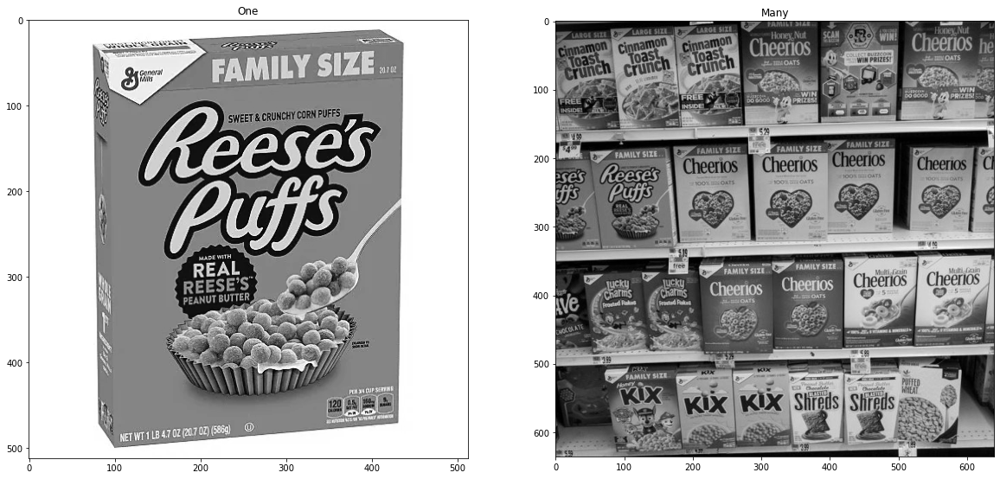

In [10]:
make_fig_gray([reeses, many_reeses], ['One', 'Many'], [1, 2], (20, 10))

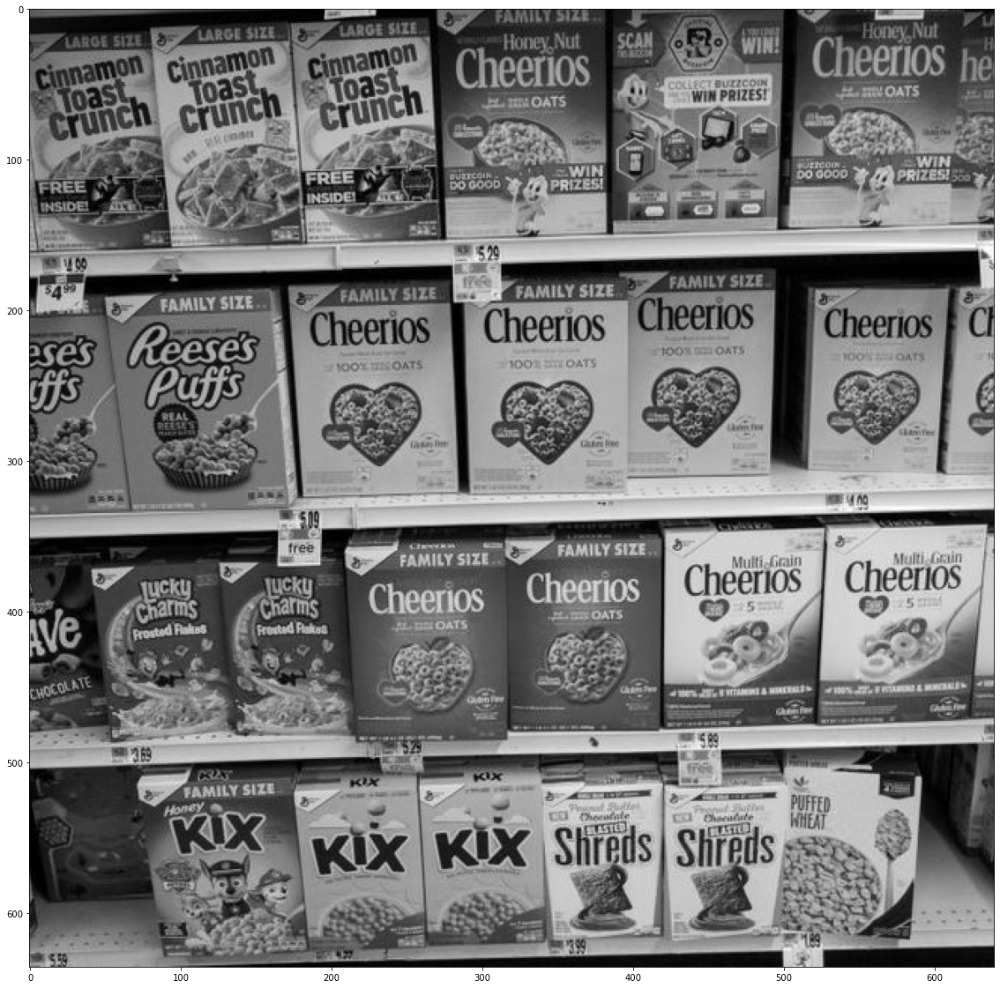

In [11]:
display_image(many_reeses)

# ORB - Orianted-Rotated Brief
ORB is basically a fusion of FAST keypoint detector and BRIEF descriptor with many modifications to enhance the performance. First it use FAST to find keypoints, then apply Harris corner measure to find top N points among them. It also use pyramid to produce multiscale-features. But one problem is that, FAST doesn't compute the orientation

In [12]:
orb = cv2.ORB_create()

In [13]:
kp1, des1 = orb.detectAndCompute(reeses, None)
kp2, des2 = orb.detectAndCompute(many_reeses, None)

In [14]:
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

In [15]:
matches = bf.match(des1, des2)

In [16]:
matches

[<DMatch 000002427BDC0690>,
 <DMatch 000002427BDC0C10>,
 <DMatch 000002427BDC0850>,
 <DMatch 000002427BDC0A50>,
 <DMatch 000002427BD811D0>,
 <DMatch 000002427BD814D0>,
 <DMatch 000002427BD812D0>,
 <DMatch 000002427BD81210>,
 <DMatch 000002427BD816F0>,
 <DMatch 000002427BD817D0>,
 <DMatch 000002427BD81430>,
 <DMatch 000002427BD81690>,
 <DMatch 000002427BD81590>,
 <DMatch 000002427BD81730>,
 <DMatch 000002427BD81790>,
 <DMatch 000002427BDE8430>,
 <DMatch 000002427BDE83F0>,
 <DMatch 000002427BDE84D0>,
 <DMatch 000002427BDE8410>,
 <DMatch 000002427BDE8270>,
 <DMatch 000002427BDE83B0>,
 <DMatch 000002427BDE83D0>,
 <DMatch 000002427BDE8390>,
 <DMatch 000002427BDE8370>,
 <DMatch 000002427BDE82B0>,
 <DMatch 000002427BDE82D0>,
 <DMatch 000002427BDE84F0>,
 <DMatch 000002427BDE8210>,
 <DMatch 000002427BDE87F0>,
 <DMatch 000002427BDE8770>,
 <DMatch 000002427BDE8790>,
 <DMatch 000002427BDE87D0>,
 <DMatch 000002427BDE87B0>,
 <DMatch 000002427BDE8650>,
 <DMatch 000002427BDE8630>,
 <DMatch 000002427BD

In [17]:
matches[0].distance

70.0

In [18]:
matches = sorted(matches, key=lambda x:x.distance)

In [21]:
matches[0].distance

27.0

In [24]:
reeses_matches = cv2.drawMatches(reeses, kp1, many_reeses, kp2, matches[:100], None, flags=2, matchColor=(0, 255, 0))

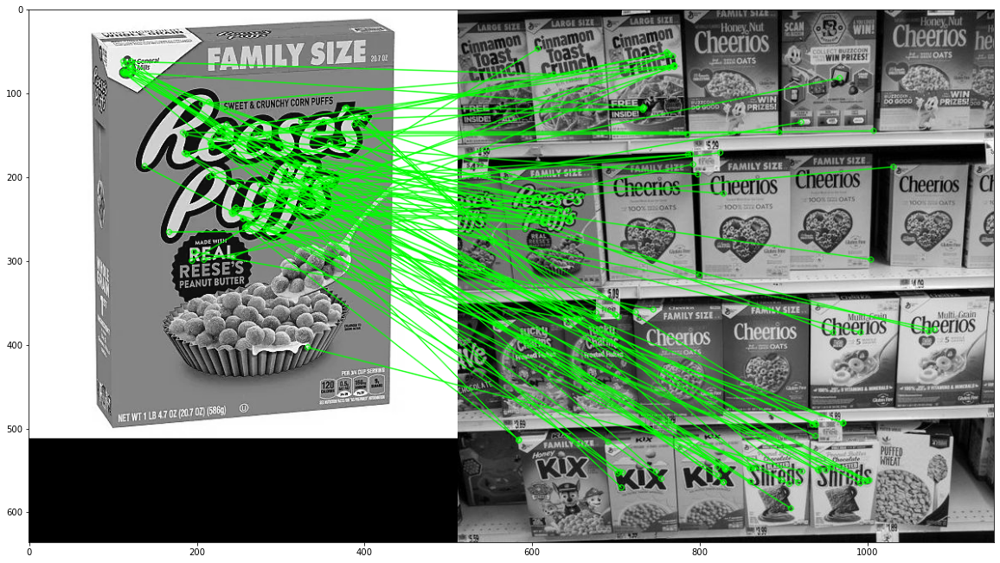

In [25]:
display_image(reeses_matches)

# SIFT - Scale Invariant Feature Transform
SIFT helps locate the local features in an image, commonly known as the ‘keypoints‘ of the image. These keypoints are scale & rotation invariant that can be used for various computer vision applications, like image matching, object detection, scene detection, etc.

We can also use the keypoints generated using SIFT as features for the image during model training. The major advantage of SIFT features, over edge features or hog features, is that they are not affected by the size or orientation of the image.

In [26]:
sift = cv2.xfeatures2d.SIFT_create()

In [27]:
kp1, des1 = sift.detectAndCompute(reeses, None)
kp2, des2 = sift.detectAndCompute(many_reeses, None)

In [28]:
bf = cv2.BFMatcher()

In [29]:
matches = bf.knnMatch(des1, des2, k=2)

In [30]:
print(len(matches))
matches

905


[[<DMatch 000002427C68CD10>, <DMatch 000002427C68CA10>],
 [<DMatch 000002427C68C770>, <DMatch 000002427C68C6B0>],
 [<DMatch 000002427C637A70>, <DMatch 000002427C637230>],
 [<DMatch 000002427C637D90>, <DMatch 000002427C637810>],
 [<DMatch 000002427C637D70>, <DMatch 000002427C6378D0>],
 [<DMatch 000002427C637930>, <DMatch 000002427C637950>],
 [<DMatch 000002427C637970>, <DMatch 000002427BD81310>],
 [<DMatch 000002427BD815D0>, <DMatch 000002427BD81330>],
 [<DMatch 000002427BD81710>, <DMatch 000002427C6B4250>],
 [<DMatch 000002427C6B4210>, <DMatch 000002427C6B42F0>],
 [<DMatch 000002427C6B4230>, <DMatch 000002427C6B4150>],
 [<DMatch 000002427C6B41D0>, <DMatch 000002427C6B40B0>],
 [<DMatch 000002427C6B4030>, <DMatch 000002427C6B40F0>],
 [<DMatch 000002427C6B4050>, <DMatch 000002427C6B4070>],
 [<DMatch 000002427C6B4510>, <DMatch 000002427C6B4550>],
 [<DMatch 000002427C6B4530>, <DMatch 000002427C6B4310>],
 [<DMatch 000002427C6B4190>, <DMatch 000002427C6B4450>],
 [<DMatch 000002427C6B4430>, <D

In [31]:
good_matches = []

for match1, match2 in matches:
    if match1.distance < 0.75*match2.distance:
        good_matches.append([match1])

In [32]:
print(len(good_matches))
good_matches

101


[[<DMatch 000002427BDF77D0>],
 [<DMatch 000002427BDF7810>],
 [<DMatch 000002427BDF7850>],
 [<DMatch 000002427BDF7890>],
 [<DMatch 000002427BDF7E50>],
 [<DMatch 000002427BDF7ED0>],
 [<DMatch 000002427BDF7F10>],
 [<DMatch 000002427BDF9090>],
 [<DMatch 000002427BDF90D0>],
 [<DMatch 000002427BDF9350>],
 [<DMatch 000002427BDF93D0>],
 [<DMatch 000002427BDF9550>],
 [<DMatch 000002427BDF9710>],
 [<DMatch 000002427BDF97D0>],
 [<DMatch 000002427BDF9910>],
 [<DMatch 000002427BDF9D50>],
 [<DMatch 000002427BDF9D90>],
 [<DMatch 000002427BDF9F90>],
 [<DMatch 000002423B2F0290>],
 [<DMatch 000002423B2F05D0>],
 [<DMatch 000002423B2F0610>],
 [<DMatch 000002423B2F0B90>],
 [<DMatch 000002423B2F0F90>],
 [<DMatch 000002423B2F2410>],
 [<DMatch 000002423B2F2510>],
 [<DMatch 000002423B2F25D0>],
 [<DMatch 000002423B2F2F90>],
 [<DMatch 000002423B2F46D0>],
 [<DMatch 000002423B2F4710>],
 [<DMatch 000002423B2F48D0>],
 [<DMatch 000002423B2F4910>],
 [<DMatch 000002423B2F4950>],
 [<DMatch 000002423B2F6610>],
 [<DMatch 

In [33]:
sift_matches = cv2.drawMatchesKnn(reeses, kp1, many_reeses, kp2, good_matches, None, flags=2, matchColor=(0, 0, 0))

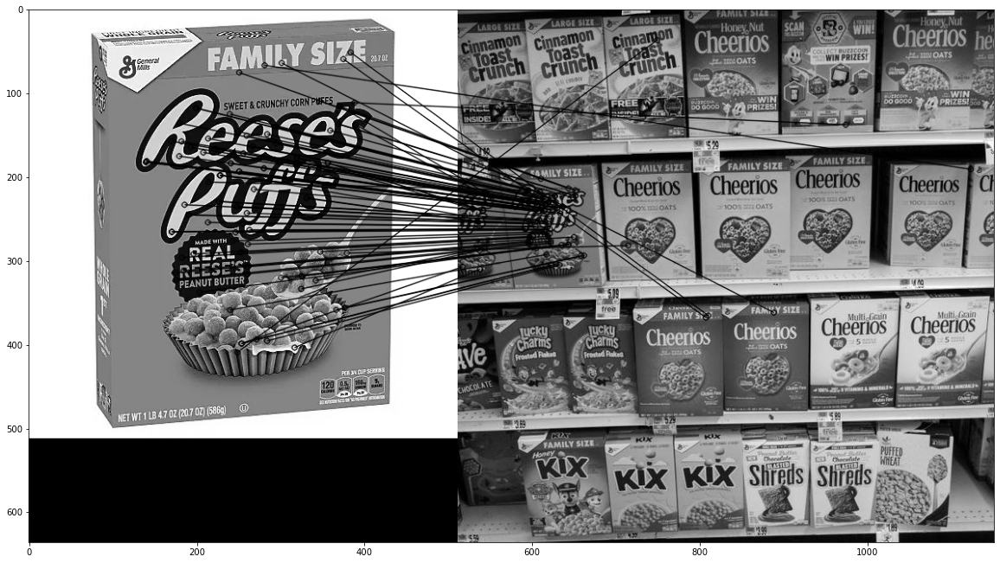

In [34]:
display_image(sift_matches)

# FLANN - Fast Library for Approximate Nearest Neighbours
It's faster than brute force method, but it won't find the BEST matches, just good matches would be fine.

In [35]:
sift = cv2.xfeatures2d.SIFT_create()

In [36]:
kp1, des1 = sift.detectAndCompute(reeses, None)
kp2, des2 = sift.detectAndCompute(many_reeses, None)

In [37]:
FLANN_INDEX_KDTREE = 0
index_params = {'algorithm': FLANN_INDEX_KDTREE, 'tree': 5}
search_params = {'checks': 50}

In [38]:
flann = cv2.FlannBasedMatcher(index_params, search_params)

In [39]:
matches = flann.knnMatch(des1, des2 ,k=2)

In [40]:
good_matches = []

for match1, match2 in matches:
    if match1.distance < 0.75*match2.distance:
        good_matches.append([match1])

In [41]:
flann_matches = cv2.drawMatchesKnn(reeses, kp1, many_reeses, kp2, good_matches, None, flags=2, matchColor=(0, 255, 0))

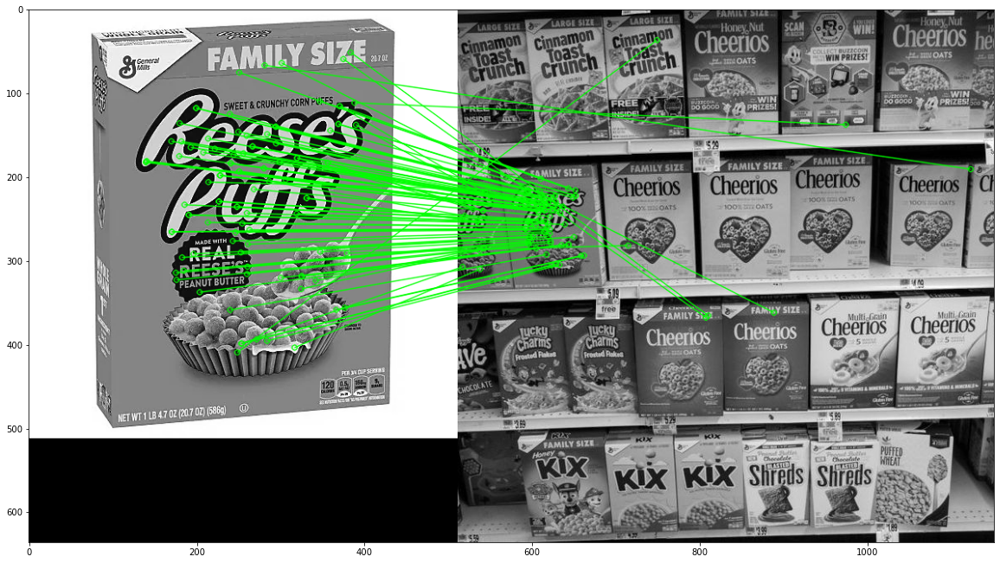

In [42]:
display_image(flann_matches)

### More Explaning of Feature Matching:
<b> https://opencv24-python-tutorials.readthedocs.io/en/stable/py_tutorials/py_feature2d/py_matcher/py_matcher.html</b>

# Image Segmentation

# Kmeans Clustering

In [50]:
dog_image_path = 'C:\\Users\\Muhammad Tarek\\Downloads\\doggy.jpg'
dog_image = cv2.imread(dog_image_path)
dog_image = cv2.cvtColor(dog_image, cv2.COLOR_BGR2RGB)

In [51]:
dog_image.shape

(602, 1200, 3)

In [52]:
pixel_values_dog = dog_image.reshape((-1, 3))
pixel_values_dog.shape

(722400, 3)

In [53]:
pixel_values_dog

array([[154, 170, 107],
       [154, 170, 107],
       [154, 170, 107],
       ...,
       [113, 134,  65],
       [115, 136,  71],
       [119, 139,  76]], dtype=uint8)

In [54]:
pixel_values_dog = np.float32(pixel_values_dog)
pixel_values_dog

array([[154., 170., 107.],
       [154., 170., 107.],
       [154., 170., 107.],
       ...,
       [113., 134.,  65.],
       [115., 136.,  71.],
       [119., 139.,  76.]], dtype=float32)

In [55]:
pixel_values_dog.shape

(722400, 3)

In [56]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 0.2) # (3, 10, 0.2)
k = 3
compactness, labels_dog, centers_dog = cv2.kmeans(pixel_values_dog, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

In [59]:
labels_dog

array([[1],
       [1],
       [1],
       ...,
       [2],
       [2],
       [2]], dtype=int32)

In [60]:
labels_dog.shape

(722400, 1)

In [58]:
centers_dog

array([[227.57129 , 213.32713 , 188.23201 ],
       [176.88579 , 170.53882 , 102.84412 ],
       [125.54756 , 124.16641 ,  71.192085]], dtype=float32)

In [61]:
centers_dog = np.uint8(centers_dog)
labels_dog = labels_dog.flatten()

In [62]:
labels_dog.shape

(722400,)

In [63]:
labels_dog

array([1, 1, 1, ..., 2, 2, 2], dtype=int32)

In [64]:
np.unique(labels_dog)

array([0, 1, 2], dtype=int32)

In [65]:
centers_dog

array([[227, 213, 188],
       [176, 170, 102],
       [125, 124,  71]], dtype=uint8)

In [66]:
segmented_image_dog = centers_dog[labels_dog.flatten()]

In [68]:
segmented_image_dog.shape

(722400, 3)

In [69]:
segmented_image_dog = segmented_image_dog.reshape(dog_image.shape)

In [70]:
segmented_image_dog.shape

(602, 1200, 3)

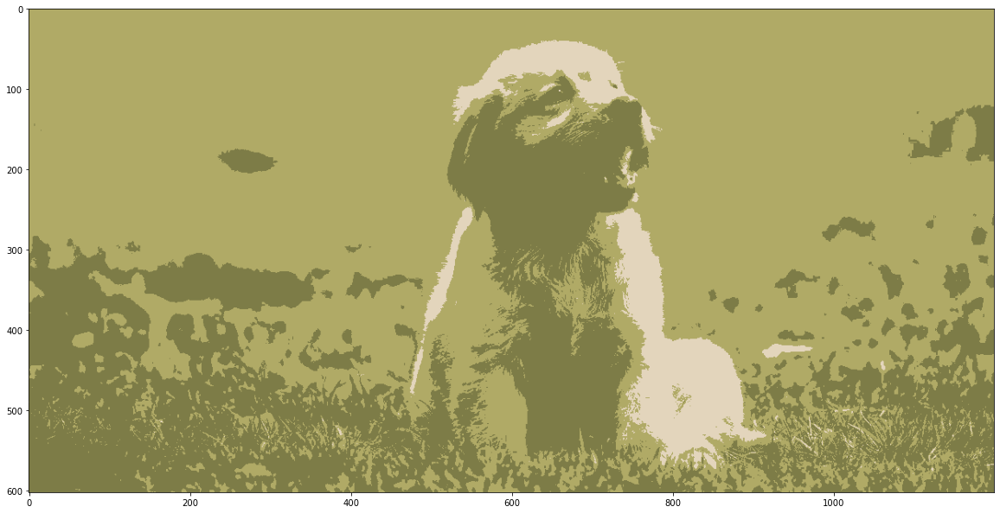

In [71]:
display_image(segmented_image_dog, None)

In [72]:
masked_image_dog = np.copy(dog_image)

In [73]:
masked_image_dog.shape

(602, 1200, 3)

In [74]:
masked_image_dog = masked_image_dog.reshape((-1, 3))

In [75]:
masked_image_dog.shape

(722400, 3)

In [76]:
masked_image_dog

array([[154, 170, 107],
       [154, 170, 107],
       [154, 170, 107],
       ...,
       [113, 134,  65],
       [115, 136,  71],
       [119, 139,  76]], dtype=uint8)

In [77]:
masked_image_dog[0]

array([154, 170, 107], dtype=uint8)

In [78]:
cluster = 2
masked_image_dog[labels_dog == cluster] = 0

In [79]:
masked_image_dog = masked_image_dog.reshape(dog_image.shape)

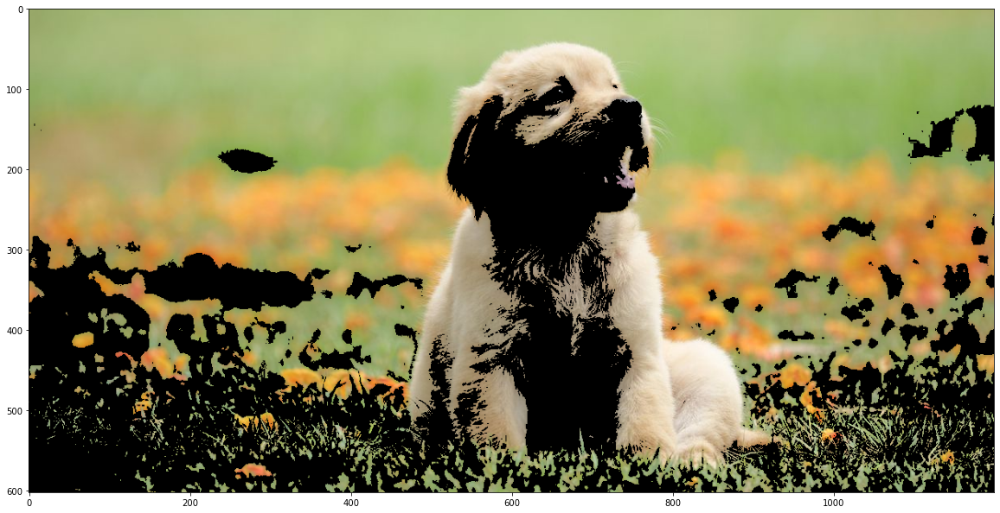

In [80]:
display_image(masked_image_dog, None)

In [81]:
def k_means_opencv(image, k=2):
    pixel_values = image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)
    
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 0.2) # (2+1, 10, 0.2), (type, max_iter, epsilon)
    compactness, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    
    centers = np.uint8(centers)
    labels = labels.flatten()
    
    segmented_image = centers[labels.flatten()]
    segmented_image = segmented_image.reshape(image.shape)
    
    return segmented_image, labels

In [82]:
from sklearn.cluster import KMeans
from sklearn.utils import shuffle

In [83]:
def k_means_sklearn(image, k=2):
    operation_image = image.copy()
    operation_image = np.array(operation_image, dtype=np.float64) / 255
    operation_image = operation_image.reshape((-1, 3))
    
#     sample_image = shuffle(operation_image, random_state=20)[:500]
    sample_image = operation_image[:10000, :]
    
    kmeans_image = KMeans(n_clusters=k, random_state=20).fit(sample_image)
    
    labels = kmeans_image.predict(operation_image)
    
    final = kmeans_image.cluster_centers_[labels.flatten()]
    
    final = final.reshape(image.shape)
    
    
    return final, labels

In [84]:
def remove_cluster(image, labels, cluster):
    masked_image = np.copy(image)
    masked_image = masked_image.reshape((-1, 3))
    
    masked_image[labels == cluster] = 0
    
    masked_image = masked_image.reshape(image.shape)
    
    return masked_image

In [85]:
nature_imae_path = 'C:\\Users\\Muhammad Tarek\\Downloads\\nature.jpg'
nature_image = cv2.imread(nature_imae_path)
nature_image = cv2.cvtColor(nature_image, cv2.COLOR_BGR2RGB)

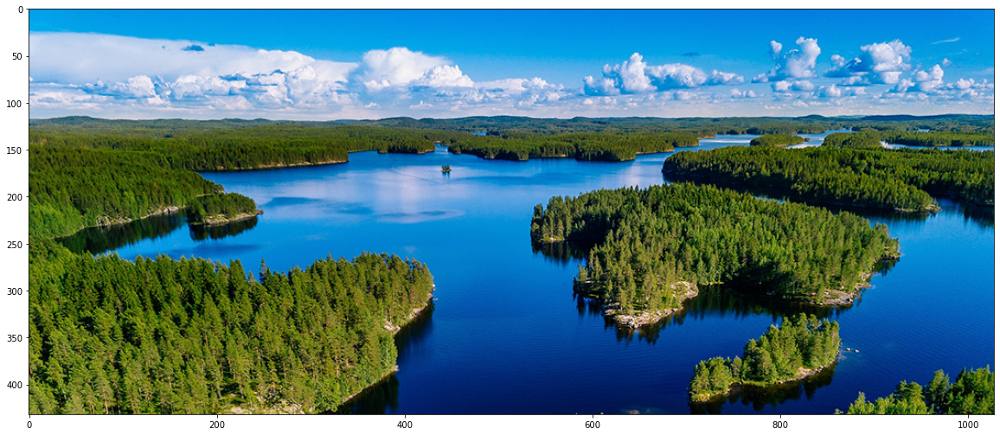

In [86]:
display_image(nature_image)

In [93]:
nature_segmented, labels_nature = k_means_opencv(nature_image, 2)

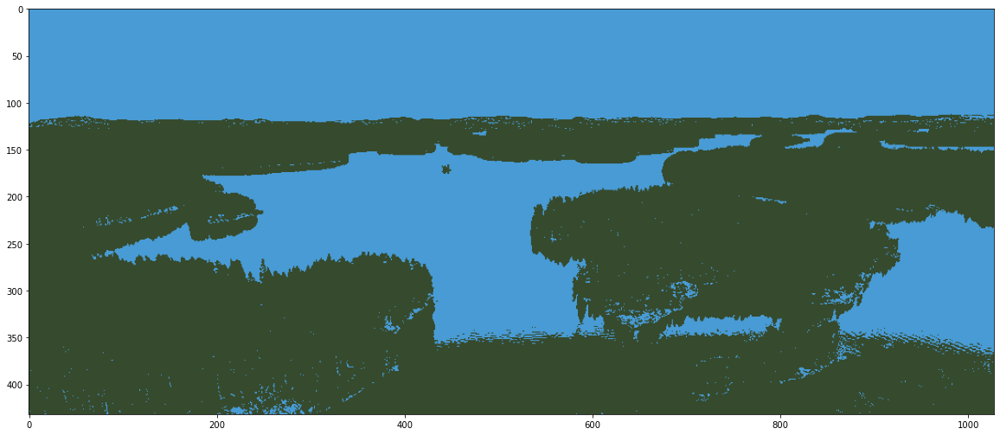

In [94]:
display_image(nature_segmented)

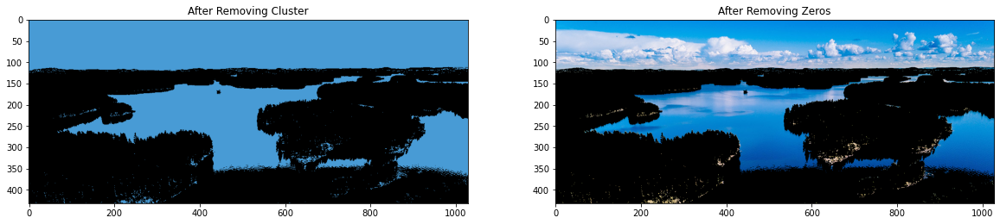

In [95]:
after_removing = remove_cluster(nature_segmented, labels_nature, 0)
removed_zeros = nature_image.copy()
removed_zeros[after_removing==0] = 0
make_fig([after_removing, removed_zeros], ['After Removing Cluster', 'After Removing Zeros'], [1, 2], (20, 10))

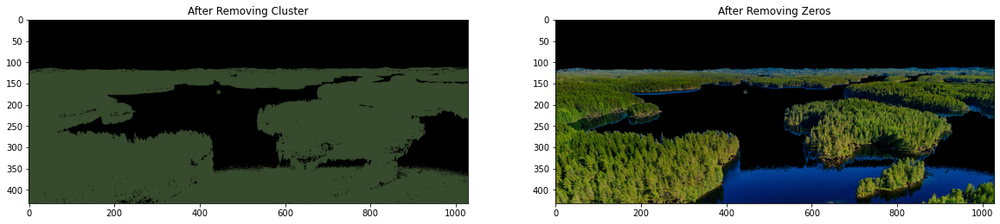

In [96]:
after_removing = remove_cluster(nature_segmented, labels_nature, 1)
removed_zeros = nature_image.copy()
removed_zeros[after_removing==0] = 0
make_fig([after_removing, removed_zeros], ['After Removing Cluster', 'After Removing Zeros'], [1, 2], (20, 10))

In [98]:
# cap = cv2.VideoCapture(0)

# while True:
#     ret, frame = cap.read()
#     segmented_frame, labels = k_means_opencv(frame, 3)

    
#     cv2.imshow('Camera', frame)
#     cv2.imshow('Segmented', segmented_frame)
#     k = cv2.waitKey(1)
#     if k == 27:
#         break
        
# cap.release()
# cv2.destroyAllWindows()

In [99]:
# cap = cv2.VideoCapture(0)

# while True:
#     ret, frame = cap.read()
#     segmented_frame, labels = k_means_sklearn(frame, 3)
# #     masked = remove_cluster(frame, labels, 1)

    
#     cv2.imshow('Camera', frame)
#     cv2.imshow('Segmented Constant', segmented_frame)
# #     cv2.imshow('sd', masked)
#     k = cv2.waitKey(1)
#     if k == 27:
#         break
        
# cap.release()
# cv2.destroyAllWindows()

In [100]:
# cap = cv2.VideoCapture(0)

# while True:
#     ret, frame = cap.read()
#     OPENCV, labels_opencv = k_means_opencv(frame, 3)
#     SKLEARN, labels_sklearn = k_means_sklearn(frame, 3)

#     cv2.imshow('Camera', frame)
#     cv2.imshow('OPENCV', OPENCV)
#     cv2.imshow('SKLEARN', SKLEARN)
#     k = cv2.waitKey(1)
#     if k == 27:
#         break
        
# cap.release()
# cv2.destroyAllWindows()

In [111]:
nature = np.array(nature_image, dtype=np.float64) / 255
nature = nature.reshape((-1, 3))

# sample_image = shuffle(nature, random_state=20)[:800]
sample_image = nature[:8000, :]

kmeans_image = KMeans(n_clusters=5).fit(sample_image)

labels = kmeans_image.predict(nature)

In [112]:
labels

array([4, 4, 4, ..., 3, 3, 3])

### More Explaining on KMeans
<b>https://www.thepythoncode.com/article/kmeans-for-image-segmentation-opencv-python</b>